In [2]:
import pandas as pd
import numpy as np
import csv
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import leastsq 

## Data clean

In [6]:
refdata = pd.read_csv("C:/Users/60223/Desktop/python/pythonproject/dataclean/data/usa1.csv",names = ['year','index'],header = None) 
costraw = pd.read_csv("C:/Users/60223/Desktop/python/pythonproject/dataclean/data/building_cost.csv",names = ['name','year','cost(usd)'])
buildingraw = pd.read_csv("C:/Users/60223/Desktop/python/pythonproject/dataclean/data/building.csv",names = ['name','city','country',
                                                                                                      'height(m)','area(m^2)','floor','start_year',
                                                                                                     'finish_year','material','use'],encoding = "ISO-8859-1")
cityraw = pd.read_csv("C:/Users/60223/Desktop/python/pythonproject/dataclean/data/city.csv",names = ['city','country',
                                                                                                      'building100','building150','building200','building300',
                                                                                                     'buildingnum','population','area'],encoding = "ISO-8859-1")

In [7]:
#transfer cost to usd 2018
cost = pd.merge(costraw,refdata, how = 'inner', on = 'year')
cost['cost(usd)'] = cost['cost(usd)']/cost['index']*100
buildingraw[['height(m)','area(m^2)','start_year','finish_year']] = buildingraw[['height(m)','area(m^2)','start_year','finish_year']].apply(pd.to_numeric)


## Data Anaylze

In [11]:
#remove 2019 for now 
building_without19 = buildingraw[buildingraw.finish_year != 2019]
year = building_without19.groupby('finish_year')

In [41]:
building_without19.groupby('country').agg('count').head()

,name,city,height(m),area(m^2),floor,start_year,finish_year,material,use
country,,,,,,,,,
AE,237,237,237,71,237,223,236,237,237
AR,11,11,11,3,11,8,11,11,11
AT,3,3,3,2,3,3,3,3,3
AU,95,95,95,45,95,81,95,95,95
AZ,4,4,4,1,4,4,4,4,4


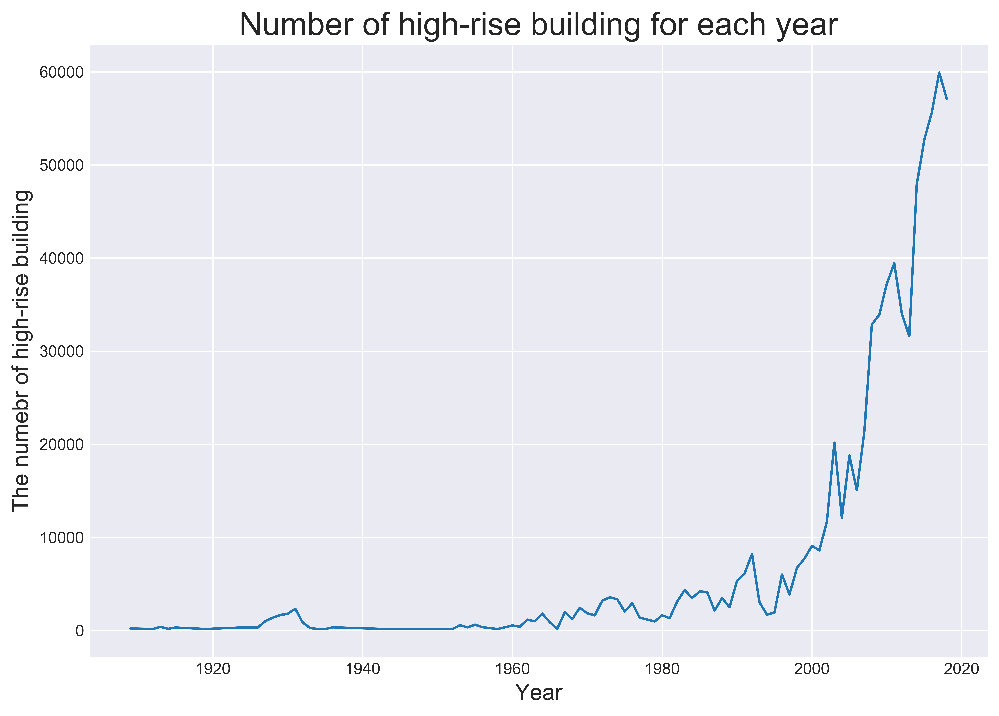

In [13]:
fig, ax = plt.subplots(figsize=(10,7),dpi = 800)
plt.style.use('seaborn-darkgrid')
palette = plt.get_cmap('Set1')

building_without19.groupby('finish_year').sum()['height(m)'].plot(ax=ax)
#data.groupby(['date','type']).count()['amount'].unstack().plot(ax=ax)
ax.set_title("Number of high-rise building for each year",fontsize=20)
ax.set_ylabel("The numebr of high-rise building",fontsize=14)
ax.set_xlabel("Year",fontsize=14)
plt.savefig('C:/Users/60223/Desktop/pre/year1.png',  format='png',transparent=True)
plt.show()



In [19]:
#sum dupulicate categories
material = building_without19.replace('steel/concrete','concrete/steel')
material = building_without19.replace('concrete/steel','composite')

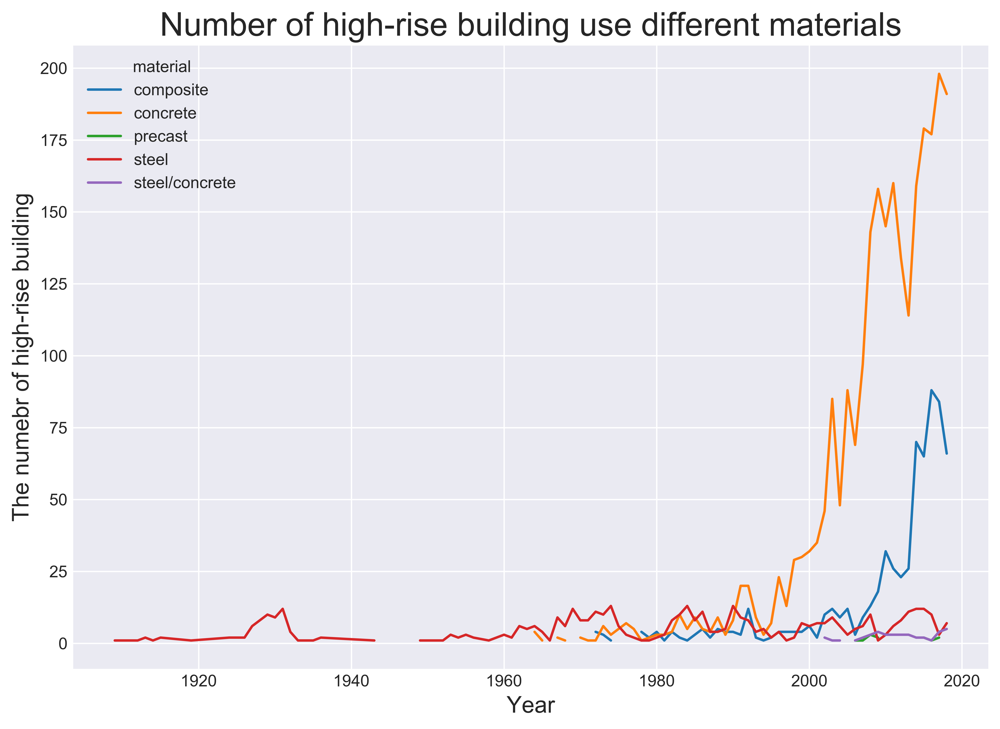

In [21]:
#construction material by years
fig, ax = plt.subplots(figsize=(10,7),dpi = 800)
material.groupby(['finish_year','material']).count()['name'].unstack().plot(ax=ax)
ax.set_title("Number of high-rise building use different materials",fontsize=20)
ax.set_ylabel("The numebr of high-rise building",fontsize=14)
ax.set_xlabel("Year",fontsize=14)
plt.savefig('C:/Users/60223/Desktop/pre/year2.png',  format='png',transparent=True)
plt.show()


In [22]:
#city population
cityraw.dropna(inplace = True)
cityraw['density'] = cityraw['population']/cityraw['area']
cityraw.head()

,city,country,building100,building150,building200,building300,buildingnum,population,area,density
0,Hong Kong,China,641,355,66,6,920.0,7234800.0,1104.0,6553.260870
1,New York City,United States,859,280,79,10,1552.0,8405837.0,469.0,17922.893390
2,Shenzhen,China,246,222,82,11,274.0,3538275.0,412.0,8588.046117
3,Dubai,United Arab Emirates,314,190,80,22,465.0,2213845.0,4114.0,538.124696
4,Shanghai,China,210,159,54,5,414.0,24150000.0,6341.0,3808.547548


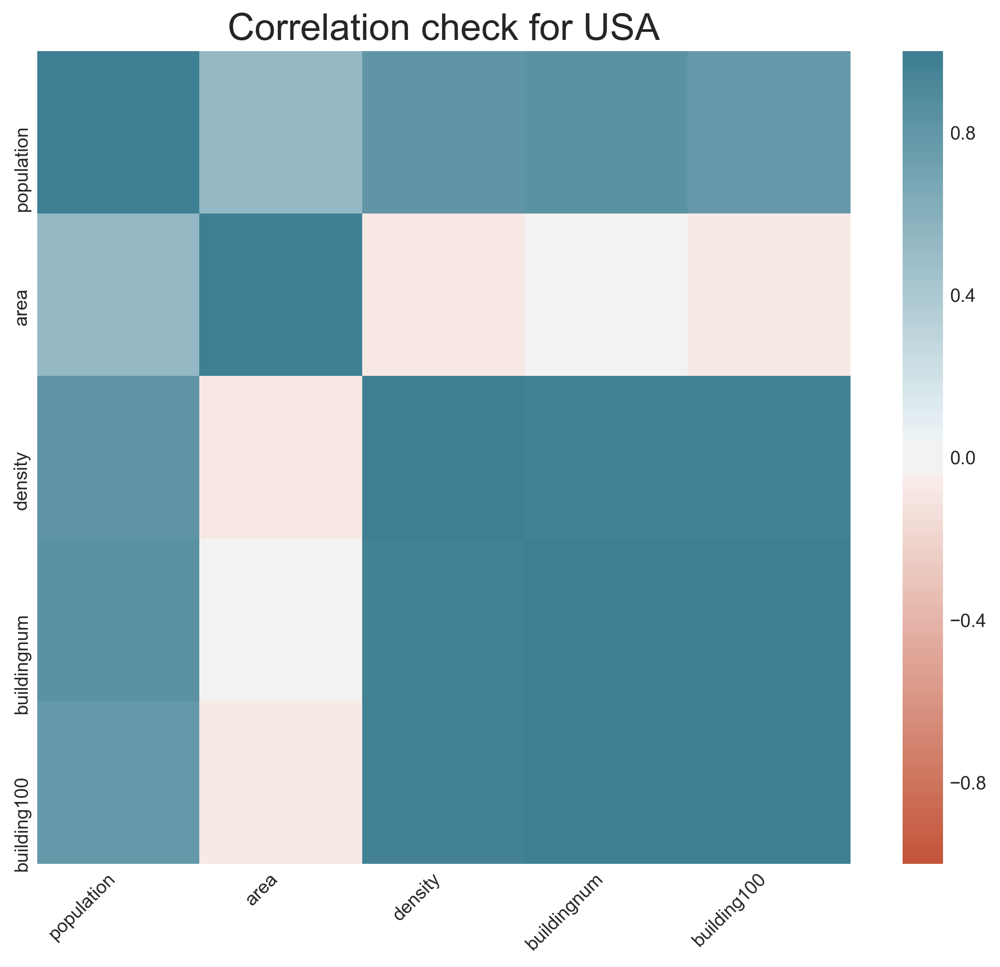

In [23]:
uscity = cityraw[cityraw['country'] == 'United States']
testcity = uscity[['population','area','density','buildingnum','building100']]
fig, ax = plt.subplots(figsize=(10,8),dpi = 300)
corr = testcity.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
ax.set_title("Correlation check for USA",fontsize=20)
plt.savefig('C:/Users/60223/Desktop/pre/yusa1.png',  format='png',transparent=True)

E:\anaconda\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


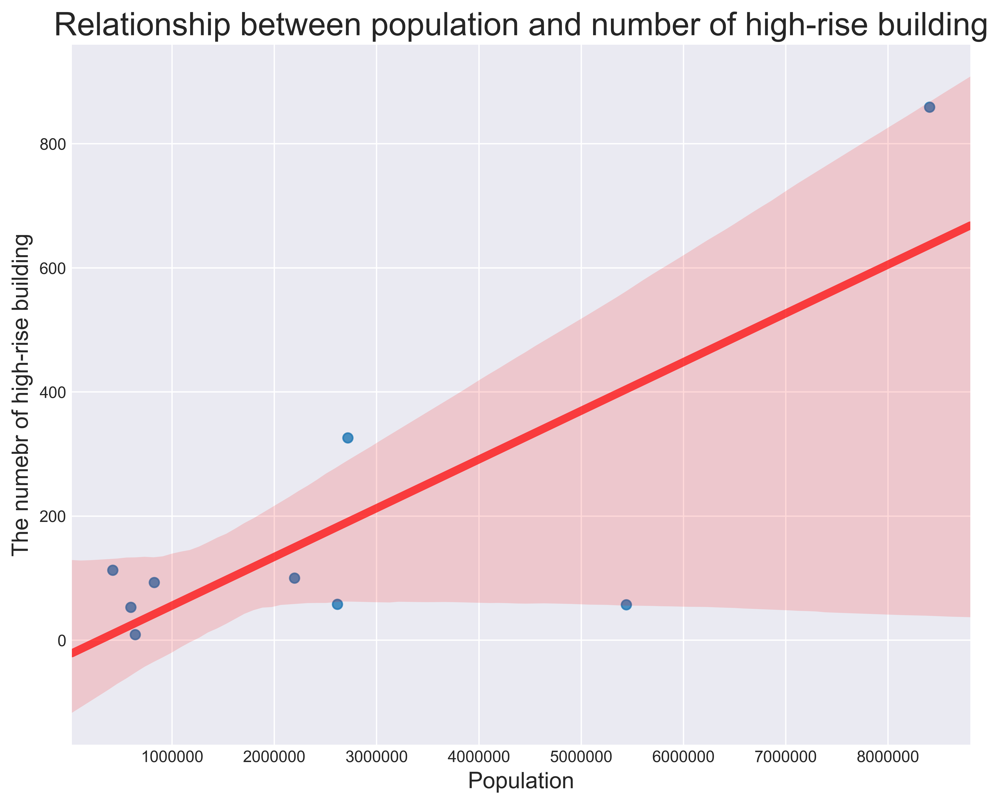

In [17]:
fig, ax = plt.subplots(figsize=(10,8),dpi = 500)
sns.regplot(x=uscity["population"], y=uscity["building100"], line_kws={"color":"r","alpha":0.7,"lw":5})
ax.set_title("Relationship between population and number of high-rise building",fontsize=20)
ax.set_ylabel("The numebr of high-rise building",fontsize=14)
ax.set_xlabel("Population",fontsize=14)
plt.savefig('C:/Users/60223/Desktop/pre/usa2.png',  format='png',transparent=True)
plt.show()

KeyError: 'density'

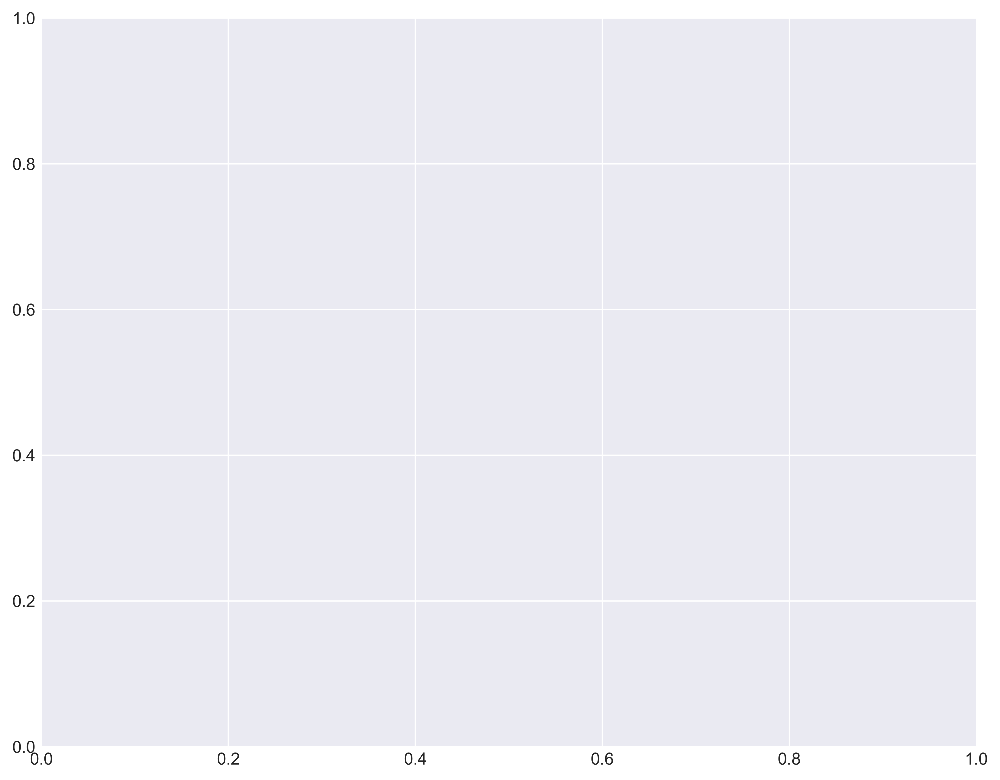

In [18]:


fig, ax = plt.subplots(figsize=(10,8),dpi = 500)
sns.regplot(x=uscity["density"], y=uscity["building100"], line_kws={"color":"r","alpha":0.7,"lw":5})
ax.set_title("Relationship between density and number of high-rise building",fontsize=20)
ax.set_ylabel("The numebr of high-rise building",fontsize=14)
ax.set_xlabel("Density",fontsize=14)
plt.savefig('C:/Users/60223/Desktop/pre/usa3.png',  format='png',transparent=True)
plt.show()

In [ ]:
cncity = cityraw[cityraw['country'] == 'China']
cncity = cncity[cncity['city'] !='Beijing']
testcity = cncity[['population','area','density','buildingnum','building100']]
fig, ax = plt.subplots(figsize=(10,8),dpi = 800)
corr = testcity.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
ax.set_title("Correlation check for China",fontsize=20)
plt.savefig('C:/Users/60223/Desktop/pre/cn1.png',  format='png',transparent=True)

In [248]:
cncity = cncity[cncity['city'] !='Beijing']


In [ ]:
fig, ax = plt.subplots(figsize=(10,8),dpi = 500)
sns.regplot(x=cncity["population"], y=cncity["buildingnum"], line_kws={"color":"r","alpha":0.7,"lw":5})
ax.set_title("Relationship between population and number of high-rise building",fontsize=20)
ax.set_ylabel("The numebr of high-rise building",fontsize=14)
ax.set_xlabel("Population",fontsize=14)
plt.savefig('C:/Users/60223/Desktop/pre/cn2.png',  format='png',transparent=True)
plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(10,8),dpi = 500)
sns.regplot(x=cncity["density"], y=cncity["buildingnum"], line_kws={"color":"r","alpha":0.7,"lw":5})
ax.set_title("Relationship between density and number of high-rise building",fontsize=20)
ax.set_ylabel("The numebr of high-rise building",fontsize=14)
ax.set_xlabel("Density",fontsize=14)
plt.savefig('C:/Users/60223/Desktop/pre/cn3.png',  format='png',transparent=True)
plt.show()

## Eco 

In [129]:
buildingraw.head()

,name,city,country,height(m),area(m^2),floor,start_year,finish_year,material,use
0,Burj Khalifa,Dubai,AE,828.0,309473.0,163.0,2004.0,2010.0,steel/concrete,office / residential / hotel
1,Shanghai Tower,Shanghai,CN,632.0,420000.0,128.0,2009.0,2015.0,composite,hotel / office
2,Makkah Royal Clock Tower,Mecca,SA,601.0,310638.0,120.0,2002.0,2012.0,steel/concrete,other / hotel
3,Ping An Finance Center,Shenzhen,CN,599.1,459187.0,115.0,2010.0,2017.0,composite,office
4,Lotte World Tower,Seoul,KR,554.5,304081.0,123.0,2011.0,2017.0,composite,hotel / residential / office / retail


In [24]:
building = buildingraw.dropna()
building["construction_time"] = buildingraw["finish_year"] - buildingraw["start_year"]
building['time_per_floor'] = building["construction_time"]/building["floor"]*365

buildingcost= pd.merge(cost[['name','cost(usd)']],building, how = 'inner', on = 'name').drop_duplicates()

buildingcost['cost_per_floor'] = buildingcost['cost(usd)']/buildingcost["floor"]
buildingcost

E:\anaconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
E:\anaconda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,name,cost(usd),city,country,height(m),area(m^2),floor,start_year,finish_year,material,use,construction_time,time_per_floor,cost_per_floor
0,One World Trade Center,3.627265e+09,New York City,US,541.3,325279.0,94.0,2006.0,2014.0,composite,office,8.0,31.063830,3.858793e+07
1,CapitaGreen,1.302095e+09,Singapore,SG,242.0,79383.0,40.0,2012.0,2014.0,composite,office,2.0,18.250000,3.255238e+07
2,Gate to the East,6.510476e+08,Suzhou,CN,301.8,450000.0,66.0,2004.0,2015.0,composite,residential / hotel / office,11.0,60.833333,9.864357e+06
3,Deutsche Bank Place,4.951717e+08,Sydney,AU,240.0,67370.0,39.0,2003.0,2005.0,composite,office,2.0,18.717949,1.269671e+07
4,Q1 Tower,3.378171e+08,Gold Coast,AU,322.5,107510.0,78.0,2002.0,2005.0,concrete,residential,3.0,14.038462,4.330989e+06
5,Shanghai Tower,2.208217e+09,Shanghai,CN,632.0,420000.0,128.0,2009.0,2015.0,composite,hotel / office,6.0,17.109375,1.725169e+07
6,Roche Turm Bau 1,5.412937e+08,Basel,CH,178.0,76000.0,41.0,2012.0,2015.0,concrete,office,3.0,26.707317,1.320228e+07
7,Evolution Tower,4.600451e+08,Moscow,RU,246.0,82000.0,55.0,2008.0,2015.0,concrete,office,7.0,46.454545,8.364457e+06
8,Diwang International Fortune Center,4.436675e+08,Liuzhou,CN,303.0,61062.0,72.0,2010.0,2015.0,composite,office / hotel,5.0,25.347222,6.162049e+06
9,New York Times Tower,8.839210e+08,New York City,US,318.8,143601.0,52.0,2004.0,2007.0,steel,office,3.0,21.057692,1.699848e+07


In [ ]:
#construction material by years
fig, ax = plt.subplots(figsize=(10,7),dpi = 800)
material.groupby(['finish_year','material']).count()['name'].unstack().plot(ax=ax)
ax.set_title("Number of high-rise building use different materials",fontsize=20)
ax.set_ylabel("The numebr of high-rise building",fontsize=14)
ax.set_xlabel("Year",fontsize=14)
plt.savefig('C:/Users/60223/Desktop/pre/year2.png',  format='png',transparent=True)
plt.show()


In [525]:
fig, ax = plt.subplots(figsize=(15,7),dpi = 1000)
plt.style.use('seaborn-darkgrid')
palette = plt.get_cmap('Set1')
building_without19[['country','name']].groupby('country').agg('count').sort_values(by = 'name',ascending=False).plot.bar(ax=ax)
#ax = building_without19[['country','name']].groupby('country').agg('count').plot.bar(rot=0)
ax.set_title("Number of high-rise building in different countries",fontsize=20)
ax.set_ylabel("The numebr of high-rise building",fontsize=14)
ax.set_xlabel("Country",fontsize=14)
ax.get_legend().remove()
plt.savefig('C:/Users/60223/Desktop/pre/nation1.png',  format='png',transparent=True)
plt.show()

In [ ]:
buildingcost[['country','cost(usd)']].groupby('country').agg('mean').sort_values(by = 'cost(usd)',ascending=False)

In [ ]:
#find top 3 country
three = building_without19.loc[(building_without19['country'] == 'CN') | (building_without19['country'] == 'US')| (building_without19['country'] == 'AE')]
cnus.head()

In [526]:
#Number of high rise building in three nations
fig, ax = plt.subplots(figsize=(15,7),dpi = 1000)
plt.style.use('seaborn-darkgrid')
palette = plt.get_cmap('Set1')

three.groupby(['finish_year','country']).sum()['height(m)'].unstack().plot(ax=ax)
#data.groupby(['date','type']).count()['amount'].unstack().plot(ax=ax)
ax.set_title("Number of high-rise building for US, China and United Arab Emirates",fontsize=20)
ax.set_ylabel("The numebr of high-rise building",fontsize=14)
ax.set_xlabel("Year",fontsize=14)
#ax.get_legend().remove()
plt.savefig('C:/Users/60223/Desktop/pre/nation2.png',  format='png',transparent=True)
plt.show()

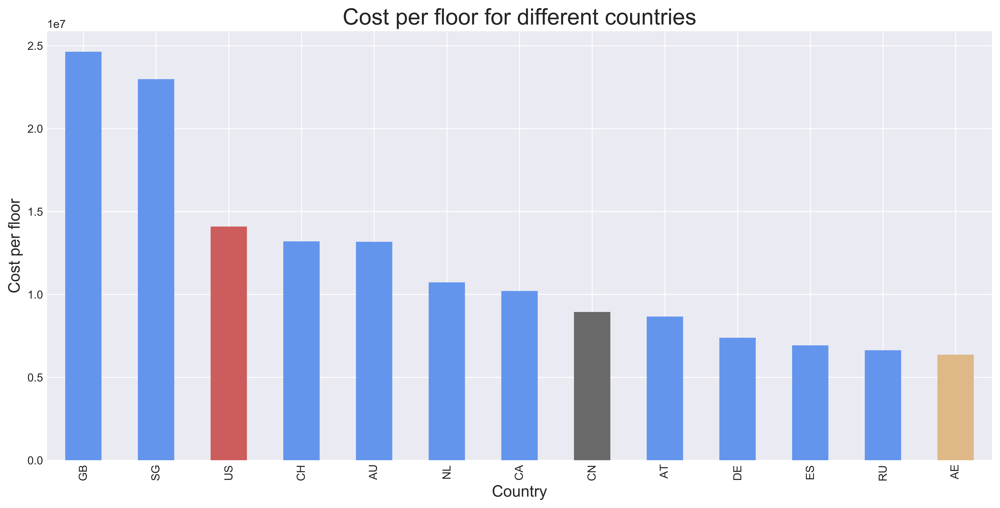

In [582]:
#cost per floor for different nations
fig, ax = plt.subplots(figsize=(15,7),dpi = 800)
plt.style.use('seaborn-darkgrid')
palette = plt.get_cmap('Set1')
colors = ['#6495ED']*13
colors[2] = '#CD5C5C'
colors[7] = '#696969'
colors[12] = '#DEB887'
buildingcost[['country','cost_per_floor']].groupby('country')\
.agg('mean').sort_values(by = 'cost_per_floor',ascending=False)\
['cost_per_floor'].plot.bar(ax=ax,color = colors)
ax.set_title("Cost per floor for different countries",fontsize=20)
ax.set_ylabel("Cost per floor", fontsize=14)
ax.set_xlabel("Country",fontsize=14)
#ax.get_legend().remove()
plt.savefig('C:/Users/60223/Desktop/pre/nation3.png',  format='png',transparent=True)
plt.show()


In [291]:
temp = buildingcost[['country','cost_per_floor']].groupby('country')\
.agg('mean').sort_values(by = 'cost_per_floor',ascending=False)
temp
#color=['#AA0000' if row.sales > row.goal else '#000088' for name,row in car_sales_sorted.iterrows()]

,cost_per_floor
country,
GB,2.464169e+07
SG,2.298522e+07
US,1.409435e+07
CH,1.320228e+07
AU,1.317878e+07
NL,1.072994e+07
CA,1.020640e+07
CN,8.943018e+06
AT,8.669338e+06


In [581]:
# cost per floor for different buildings
fig, ax = plt.subplots(figsize=(15,7),dpi = 1000)
plt.style.use('seaborn-darkgrid')
palette = plt.get_cmap('Set1')


temp = buildingcost[['name','cost_per_floor']].groupby('name').agg('mean').\
sort_values(by = 'cost_per_floor',ascending=False)
colors = ['#6495ED']*50
colors[1] = '#CD5C5C'
colors[6] = '#696969'
colors[24] = '#DEB887'
temp['cost_per_floor'].plot.bar(ax =ax,color = colors)
ax.set_title("Cost per floor for different buildings",fontsize=20)
ax.set_ylabel("Cost per floor", fontsize=14)
ax.set_xlabel("Building",fontsize=14)
#ax.get_legend().remove()
plt.savefig('C:/Users/60223/Desktop/pre/nation4.png',  format='png',transparent=True)
plt.show()



In [370]:
buildingcost

,name,cost(usd),city,country,height(m),area(m^2),floor,start_year,finish_year,material,use,construction_time,time_per_floor,cost_per_floor
0,One World Trade Center,3.627265e+09,New York City,US,541.3,325279.0,94.0,2006.0,2014.0,composite,office,8.0,31.063830,3.858793e+07
1,CapitaGreen,1.302095e+09,Singapore,SG,242.0,79383.0,40.0,2012.0,2014.0,composite,office,2.0,18.250000,3.255238e+07
2,Gate to the East,6.510476e+08,Suzhou,CN,301.8,450000.0,66.0,2004.0,2015.0,composite,residential / hotel / office,11.0,60.833333,9.864357e+06
3,Deutsche Bank Place,4.951717e+08,Sydney,AU,240.0,67370.0,39.0,2003.0,2005.0,composite,office,2.0,18.717949,1.269671e+07
4,Q1 Tower,3.378171e+08,Gold Coast,AU,322.5,107510.0,78.0,2002.0,2005.0,concrete,residential,3.0,14.038462,4.330989e+06
5,Shanghai Tower,2.208217e+09,Shanghai,CN,632.0,420000.0,128.0,2009.0,2015.0,composite,hotel / office,6.0,17.109375,1.725169e+07
6,Roche Turm Bau 1,5.412937e+08,Basel,CH,178.0,76000.0,41.0,2012.0,2015.0,concrete,office,3.0,26.707317,1.320228e+07
7,Evolution Tower,4.600451e+08,Moscow,RU,246.0,82000.0,55.0,2008.0,2015.0,concrete,office,7.0,46.454545,8.364457e+06
8,Diwang International Fortune Center,4.436675e+08,Liuzhou,CN,303.0,61062.0,72.0,2010.0,2015.0,composite,office / hotel,5.0,25.347222,6.162049e+06
9,New York Times Tower,8.839210e+08,New York City,US,318.8,143601.0,52.0,2004.0,2007.0,steel,office,3.0,21.057692,1.699848e+07


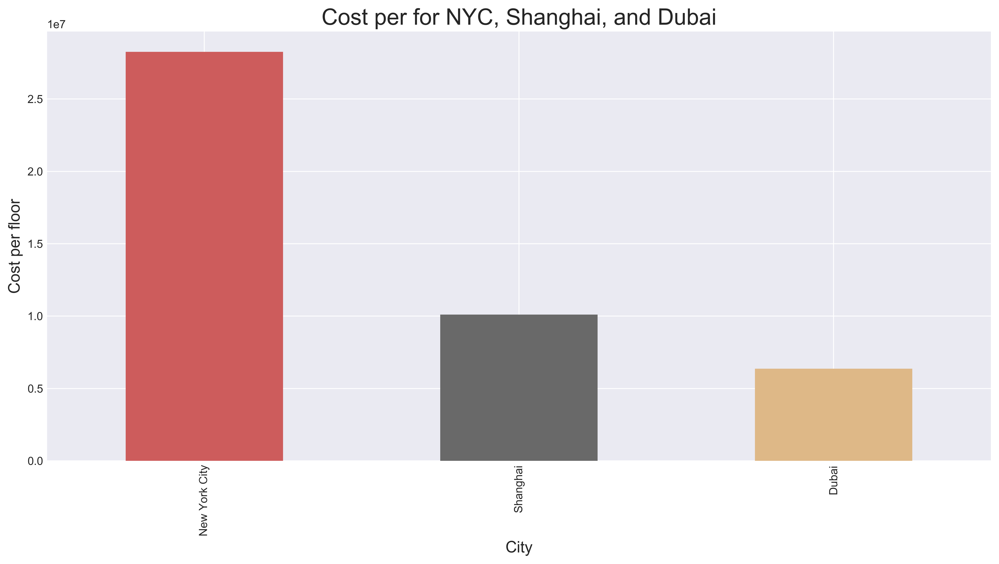

In [552]:
# cost per floor in 3 cities
fig, ax = plt.subplots(figsize=(15,7),dpi = 500)
plt.style.use('seaborn-darkgrid')
palette = plt.get_cmap('Set1')
temp = buildingcost[['city','cost_per_floor']].groupby('city').agg('mean').sort_values(by = 'cost_per_floor',ascending=False)
temp = temp.loc[['New York City','Shanghai','Dubai']]
colors = np.asarray(['#CD5C5C','#696969','#DEB887'])
temp['cost_per_floor'].plot.bar(ax =ax, color = colors)
ax.set_title("Cost per for NYC, Shanghai, and Dubai",fontsize=20)
ax.set_ylabel("Cost per floor",fontsize=14)
ax.set_xlabel("City",fontsize=14)
plt.savefig('C:/Users/60223/Desktop/pre/nation6.png',  format='png',transparent=True)
plt.show()

In [ ]:
# function used in regression
def func(params, x):
    a, b, c = params
    return a * x * x + b * x + c

def error(params, x, y):
    return func(params, x) - y
def slovePara(X,Y):
    p0 = [10, 10, 10]

    Para = leastsq(error, p0, args=(X, Y))
    return Para

In [37]:
#Relationship between cost per floor and number of floors
fig, ax = plt.subplots(figsize=(15,7),dpi = 1000)
plt.style.use('seaborn-darkgrid')
palette = plt.get_cmap('Set1')
#buildingcost[buildingcost['city'] == 'New York City']
NY = buildingcost[buildingcost['city'] == 'New York City'][['floor','cost_per_floor']]
SH = buildingcost[buildingcost['city'] == 'Shanghai'][['floor','cost_per_floor']]
NY.plot.scatter(ax =ax,x = 'floor', y = 'cost_per_floor',color = 'red')
SH.plot.scatter(ax =ax,x = 'floor', y = 'cost_per_floor')
X1 =  NY['floor']
Y1= NY['cost_per_floor']
Para1 = slovePara(X1,Y1)
a1, b1, c1 = Para1[0]
plt.plot(np.linspace(0,150,1000),a1*x*x+b1*x+c1,color="red",label="NYC",linewidth=3)

X2 =  SH['floor']
Y2= SH['cost_per_floor']

Para2 = slovePara(X2,Y2)
a2, b2, c2 = Para2[0]


plt.plot(np.linspace(0,150,1000),a2*x*x+b2*x+c2,label="Shanghai",linewidth=2)
plt.legend(fontsize=18) 
ax.set_title("My Plot Title")
ax.set_ylabel("The numebr of high-rise building")
ax.set_xlabel("Year")
ax.set_title("Relationship of floor and cost for NYC and Shanghai",fontsize=20)
ax.set_ylabel("Cost per floor", fontsize=14)
ax.set_xlabel("Floor",fontsize=14)
#ax.get_legend().remove()
plt.savefig('C:/Users/60223/Desktop/pre/nation5.png',  format='png',transparent=True)
plt.show()


In [39]:
fig, ax = plt.subplots(figsize=(15,7),dpi = 1000)
plt.style.use('seaborn-darkgrid')
palette = plt.get_cmap('Set1')
#buildingcost[buildingcost['city'] == 'New York City']
temp = buildingcost[['floor','cost_per_floor']]

temp.plot.scatter(ax =ax,x = 'floor', y = 'cost_per_floor')

X1 =  temp['floor']
Y1= temp['cost_per_floor']
Para1 = slovePara(X1,Y1)
a1, b1, c1 = Para1[0]
x=np.linspace(0,150,1000) ##在0-15直接画100个连续点
y=a1*x*x+b1*x+c1 ##函数式
plt.plot(x,y,color="red",label="solution line",linewidth=2)
#plt.plot(np.linspace(0,150,1000),a1*x*x+b1*x+c1,color="red",label="NYC",linewidth=3)




plt.legend(fontsize=18) 
ax.set_title("My Plot Title")
ax.set_ylabel("The numebr of high-rise building")
ax.set_xlabel("Year")
ax.set_title("Relationship of floor and cost",fontsize=20)
ax.set_ylabel("Cost per floor", fontsize=14)
ax.set_xlabel("Floor",fontsize=14)
ax.get_legend().remove()
plt.savefig('C:/Users/60223/Desktop/pre/nation7.png',  format='png',transparent=True)
plt.show()

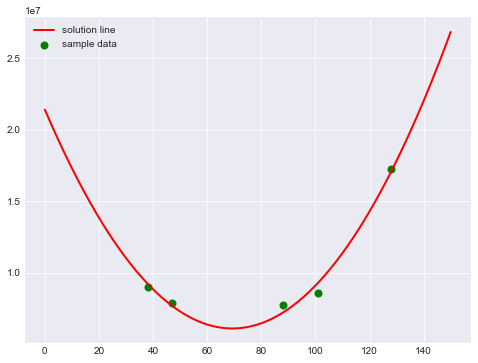

In [435]:
##example of regresion
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
from scipy.optimize import leastsq

'''
     设置样本数据，真实数据需要在这里处理
'''
##样本数据(Xi,Yi)，需要转换成数组(列表)形式
Xi=np.array([1,2,3,4,5,6])
#Yi=np.array([9,18,31,48,69,94])
Yi=np.array([9.1,18.3,32,47,69.5,94.8])

'''
    设定拟合函数和偏差函数
    函数的形状确定过程：
    1.先画样本图像
    2.根据样本图像大致形状确定函数形式(直线、抛物线、正弦余弦等)
'''

##需要拟合的函数func :指定函数的形状
def func(p,x):
    a,b,c=p
    return a*x*x+b*x+c

##偏差函数：x,y都是列表:这里的x,y更上面的Xi,Yi中是一一对应的
def error(p,x,y):
    return func(p,x)-y

'''
    主要部分：附带部分说明
    1.leastsq函数的返回值tuple，第一个元素是求解结果，第二个是求解的代价值(个人理解)
    2.官网的原话（第二个值）：Value of the cost function at the solution
    3.实例：Para=>(array([ 0.61349535,  1.79409255]), 3)
    4.返回值元组中第一个值的数量跟需要求解的参数的数量一致
'''

#k,b的初始值，可以任意设定,经过几次试验，发现p0的值会影响cost的值：Para[1]
p0=[10,10,10]

#把error函数中除了p0以外的参数打包到args中(使用要求)
Para=leastsq(error,p0,args=(Xi,Yi))

#读取结果
a,b,c=Para[0]
print("a=",a,"b=",b,"c=",c)
print("cost："+str(Para[1]))
print("求解的拟合直线为:")
print("y="+str(round(a,2))+"x*x+"+str(round(b,2))+"x+"+str(c))

'''
   绘图，看拟合效果.
   matplotlib默认不支持中文，label设置中文的话需要另行设置
   如果报错，改成英文就可以
'''

#画样本点
plt.figure(figsize=(8,6)) ##指定图像比例： 8：6
plt.scatter(Xi,Yi,color="green",label="样本数据",linewidth=2) 

#画拟合直线
x=np.linspace(0,12,100) ##在0-15直接画100个连续点
y=a*x*x+b*x+c ##函数式
plt.plot(x,y,color="red",label="拟合直线",linewidth=2) 
plt.legend() #绘制图例
plt.show()